In [1]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, minmax_scale

In [2]:
data = pd.read_csv("./유방암.csv", engine='python')
data.head()

,diagnosis,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
data.shape

(569, 31)

In [4]:
data.isnull().sum(axis = 0)

diagnosis                  0
mean radius                0
mean texture               0
mean perimeter             0
mean area                  0
mean smoothness            0
mean compactness           0
mean concavity             0
mean concave points        0
mean symmetry              0
mean fractal dimension     0
radius error               0
texture error              0
perimeter error            0
area error                 0
smoothness error           0
compactness error          0
concavity error            0
concave points error       0
symmetry error             0
fractal dimension error    0
worst radius               0
worst texture              0
worst perimeter            0
worst area                 0
worst smoothness           0
worst compactness          0
worst concavity            0
worst concave points       0
worst symmetry             0
worst fractal dimension    0
dtype: int64

In [5]:
table = str.maketrans(' ', '_')
rename_dict = { col:col.lower().translate(table)  for col in data.columns}

data.rename(columns=rename_dict,inplace=True)
data.columns

Index(['diagnosis', 'mean_radius', 'mean_texture', 'mean_perimeter',
       'mean_area', 'mean_smoothness', 'mean_compactness', 'mean_concavity',
       'mean_concave_points', 'mean_symmetry', 'mean_fractal_dimension',
       'radius_error', 'texture_error', 'perimeter_error', 'area_error',
       'smoothness_error', 'compactness_error', 'concavity_error',
       'concave_points_error', 'symmetry_error', 'fractal_dimension_error',
       'worst_radius', 'worst_texture', 'worst_perimeter', 'worst_area',
       'worst_smoothness', 'worst_compactness', 'worst_concavity',
       'worst_concave_points', 'worst_symmetry', 'worst_fractal_dimension'],
      dtype='object')

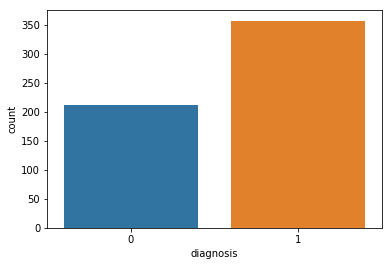

In [6]:
sns.countplot(data.diagnosis,label="Count")

diagnosis
0    AxesSubplot(0.125,0.125;0.775x0.755)
1    AxesSubplot(0.125,0.125;0.775x0.755)
Name: mean_radius, dtype: object

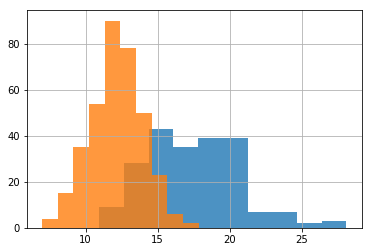

In [7]:
data.groupby("diagnosis")["mean_radius"].hist(alpha=0.8)

In [8]:
for n in range(data.shape[1]//10):
    plt.figure(figsize=(20,10))
    sns.boxplot(x="features", y="value", hue="diagnosis", data=data_x.iloc[(n*10)*data.shape[0]:((n+1)*10)*data.shape[0],:])
    plt.xticks(rotation=90)

NameError: name 'data_x' is not defined

<Figure size 1440x720 with 0 Axes>

In [9]:
data_dia_0 = data[data.diagnosis == 0]
data_dia_0.shape

(212, 31)

In [10]:
data_dia_1 = data[data.diagnosis == 1]
data_dia_1.shape

(357, 31)

In [11]:
def remove_outlier(data):# inplace True로 할 경우 반복문을 돌면서 계속 표준편차가 변하기 때문에 많은 데이터가 지워지게 됨 ##수정해라
    for key in data.drop("diagnosis",axis=1).columns:
        data.drop(data[np.abs(data[key]-data[key].mean()) > (3*data[key].std())].index,inplace=True)
        data.drop(data[~(np.abs(data[key]-data[key].mean()) < (3*data[key].std()))].index,inplace=True)

In [12]:
remove_outlier(data_dia_0)
data_dia_0.shape

/home/pirl/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3697: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors=errors)


(151, 31)

In [13]:
remove_outlier(data_dia_1)
data_dia_1.shape

(259, 31)

In [75]:
for key in data.drop('diagnosis',axis=1).columns:
    data.drop(data[np.abs(data[key]-data[key].mean()) > (3*data[key].std())].index,inplace=True)
    data.drop(data[~(np.abs(data[key]-data[key].mean()) < (3*data[key].std()))].index,inplace=True)

In [50]:
data = pd.concat([data_dia_0,data_dia_1])
data_y = data.diagnosis.reset_index().drop('index',axis=1)
# data_y
data_x = data.drop('diagnosis',axis=1)
data_n_2 = pd.DataFrame(scale(data_x),columns=data_x.columns)
# # pd.concat([data_y,data_n_2],axis=1).head()

data_x = pd.concat([data_y,data_n_2],axis=1)
data_x = pd.melt(data_x,id_vars="diagnosis", var_name="features", value_name='value')

In [49]:
data_x.shape

(12300, 3)

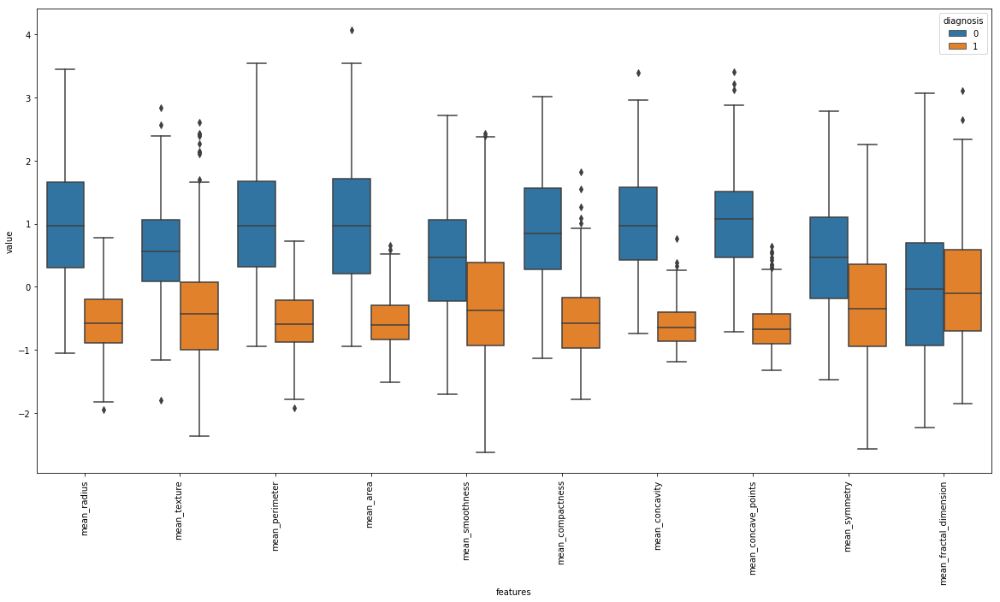

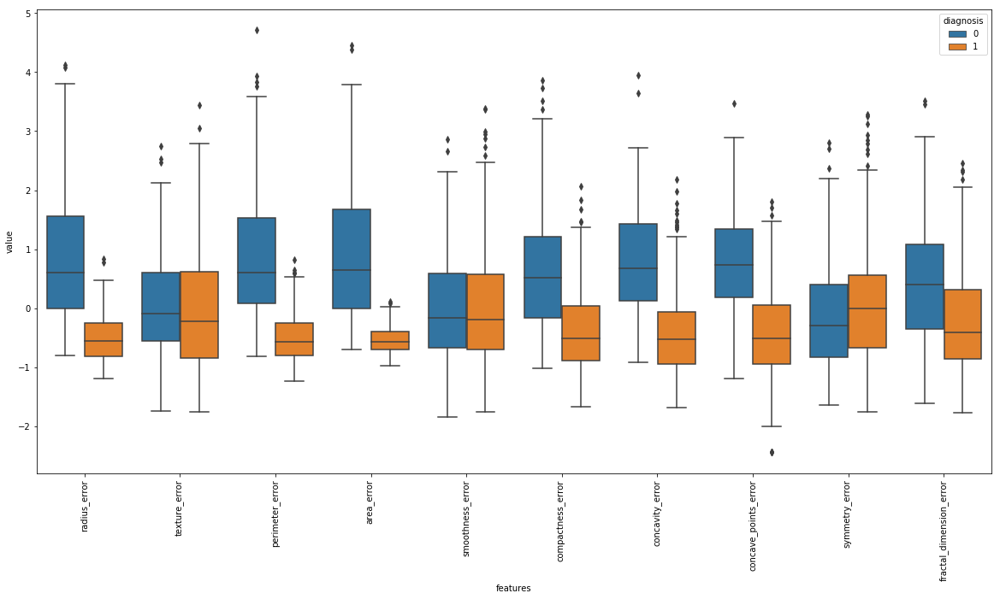

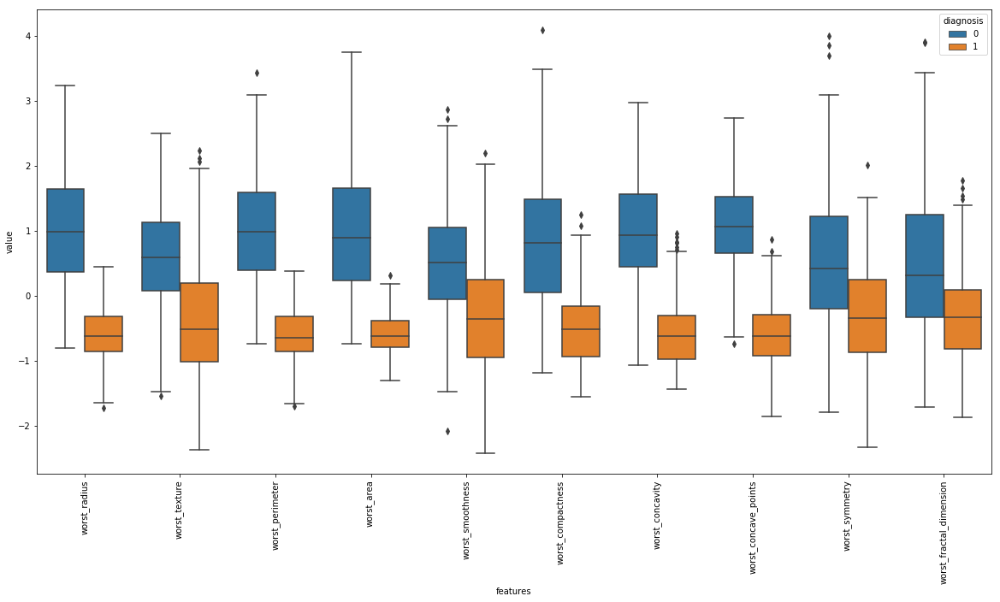

In [51]:
for n in range(data.shape[1]//10):
    plt.figure(figsize=(20,10))
    sns.boxplot(x="features", y="value", hue="diagnosis", data=data_x.iloc[(n*10)*data.shape[0]:((n+1)*10)*data.shape[0],:])
    plt.xticks(rotation=90)

/home/pirl/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/home/pirl/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


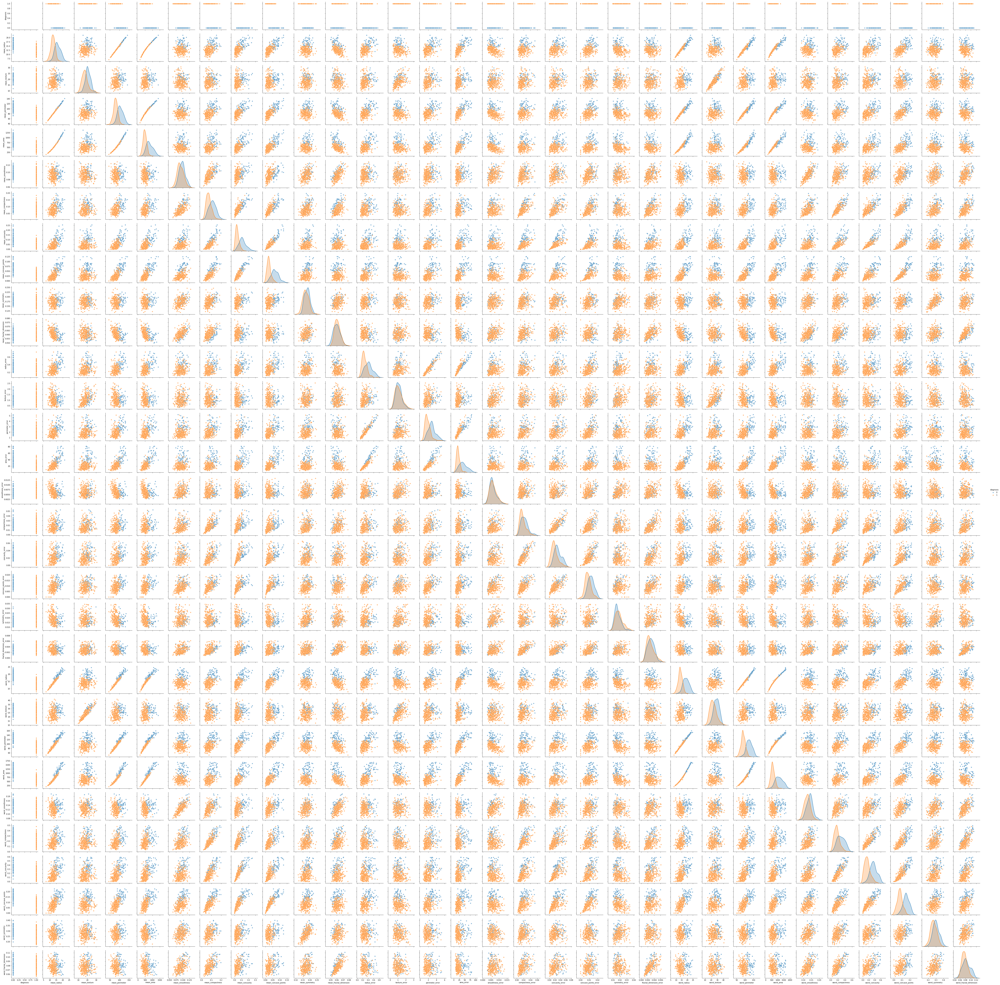

In [79]:
sns.pairplot(data,hue="diagnosis",plot_kws=dict(alpha=0.6))

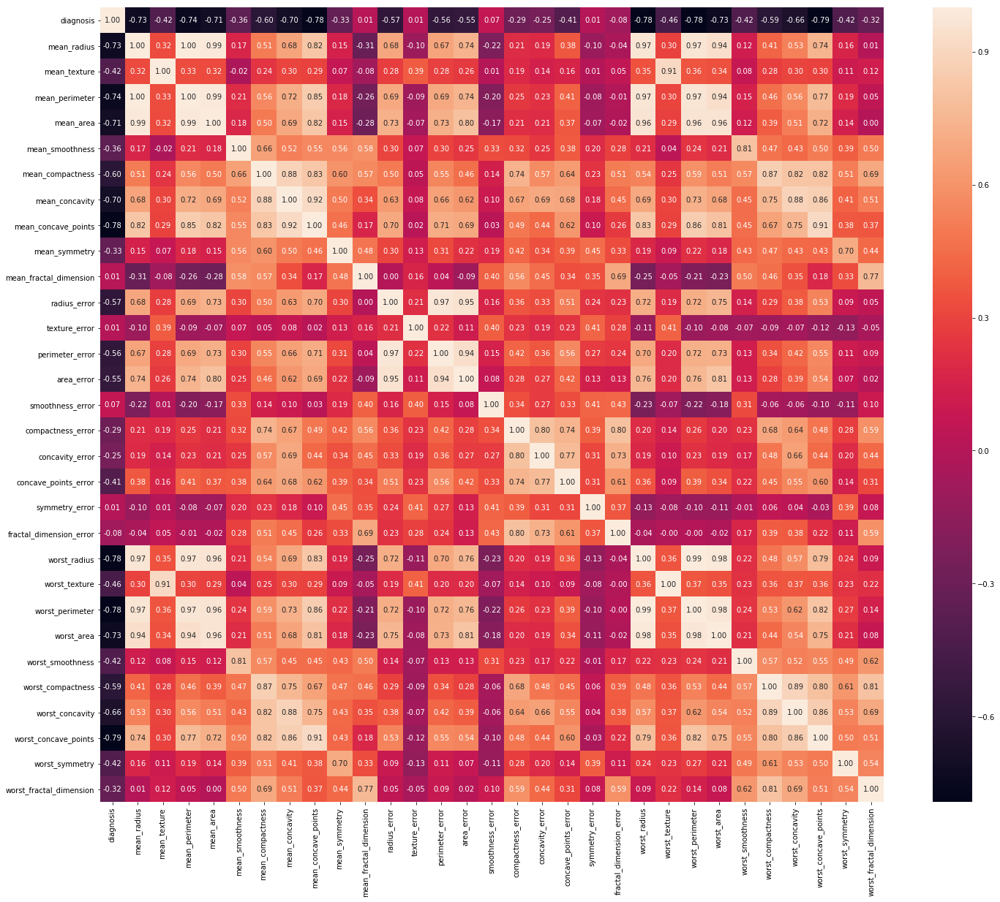

In [45]:
plt.figure(figsize=(24,20))
sns.heatmap(data.corr(),annot=True, fmt='.2f')

In [92]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
df_x_const = sm.add_constant(data.drop(["diagnosis"],axis=1,inplace=False))
df_vif = pd.DataFrame()
df_vif["variable"] = df_x_const.columns
df_vif["vif"] = [variance_inflation_factor(df_x_const.values,i) for i in range(df_x_const.shape[1])]
df_vif.sort_values("vif", inplace=True)
df_vif.round(3)

,variable,vif
9,mean_symmetry,3.917
19,symmetry_error,5.838
15,smoothness_error,6.335
12,texture_error,6.949
20,fractal_dimension_error,9.264
29,worst_symmetry,9.382
10,mean_fractal_dimension,10.881
5,mean_smoothness,11.061
18,concave_points_error,12.283
2,mean_texture,16.378


In [80]:
np.random.seed(seed=1234)
msk = np.random.rand(data.shape[0],) < 0.7
train = data[msk]
test = data[~msk]

In [81]:
log_model = sm.Logit.from_formula("diagnosis~"+"+".join(train.columns[1:]) + "+1",train)
log_res = log_model.fit(method="bfgs")
print(log_res.summary())

         Current function value: 0.116385
         Iterations: 35
         Function evaluations: 46
         Gradient evaluations: 40
                           Logit Regression Results                           
Dep. Variable:              diagnosis   No. Observations:                  251
Model:                          Logit   Df Residuals:                      220
Method:                           MLE   Df Model:                           30
Date:                Sat, 09 Feb 2019   Pseudo R-squ.:                  0.7742
Time:                        22:12:08   Log-Likelihood:                -29.213
converged:                      False   LL-Null:                       -129.39
                                        LLR p-value:                 4.265e-27
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   0.8693     36.206     

/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1724: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/home/pirl/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


In [82]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'min_samples_split': [2,3,4,5,6,7,8,9,10], 
              'min_samples_leaf':[2,3,4,5,6,7,8,9,10] }
model= DecisionTreeClassifier()
clf = GridSearchCV(model,param_grid,cv=10,scoring="accuracy")
clf.fit(train.drop("diagnosis",axis=1),train.diagnosis)


/home/pirl/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:841: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


AttributeError: 'GridSearchCV' object has no attribute 'grid_scores_'

In [87]:
clf.cv_results_["params"]

[{'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 2},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 4},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 5},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 6},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 7},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 8},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 9},
 {'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 10},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 2},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 3},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 4},
 {'max_features': 'auto', 'min_samples_leaf': 3, 'min_samples_split': 5},
 {'max_features': 'auto', 'min_sample

In [88]:
clf.cv_results_["mean_test_score"]

array([0.88844622, 0.89641434, 0.88047809, 0.88446215, 0.9123506 ,
       0.92828685, 0.91633466, 0.88844622, 0.90039841, 0.89243028,
       0.9123506 , 0.91633466, 0.89641434, 0.90039841, 0.90836653,
       0.90836653, 0.88446215, 0.88047809, 0.92430279, 0.91633466,
       0.9123506 , 0.92430279, 0.92430279, 0.89641434, 0.90836653,
       0.9123506 , 0.90438247, 0.94422311, 0.9123506 , 0.9123506 ,
       0.92031873, 0.93625498, 0.92828685, 0.92031873, 0.92031873,
       0.95219124, 0.90438247, 0.90836653, 0.93227092, 0.90438247,
       0.9123506 , 0.92430279, 0.90836653, 0.92430279, 0.90039841,
       0.90836653, 0.92031873, 0.90836653, 0.9123506 , 0.92430279,
       0.9123506 , 0.87250996, 0.92031873, 0.89641434, 0.9123506 ,
       0.90438247, 0.91633466, 0.90438247, 0.90836653, 0.92031873,
       0.90836653, 0.90438247, 0.90836653, 0.90836653, 0.89243028,
       0.89641434, 0.8685259 , 0.89243028, 0.91633466, 0.88844622,
       0.88844622, 0.88446215, 0.89641434, 0.90438247, 0.90039

In [86]:
clf.
clf.best_params_
clf.best_estimator_
clf.best_score_

0.952191235059761